## **Global Sales Analysis**

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
from scipy.stats import zscore
import warnings
warnings.filterwarnings('ignore')

In [2]:
ss = pd.read_csv('/content/superstore.csv')

In [3]:
pip install ydata-profiling

In [4]:
from ydata_profiling import ProfileReport
profile = ProfileReport(ss)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# **Pre Processing and EDA**

In [5]:
ss.head(10)

,Category,City,Country,Customer.ID,Customer.Name,Discount,Market,记录数,Order.Date,Order.ID,...,Sales,Segment,Ship.Date,Ship.Mode,Shipping.Cost,State,Sub.Category,Year,Market2,weeknum
0,Office Supplies,Los Angeles,United States,LS-172304,Lycoris Saunders,0.0,US,1,2011-01-07 00:00:00.000,CA-2011-130813,...,19,Consumer,2011-01-09 00:00:00.000,Second Class,4.37,California,Paper,2011,North America,2
1,Office Supplies,Los Angeles,United States,MV-174854,Mark Van Huff,0.0,US,1,2011-01-21 00:00:00.000,CA-2011-148614,...,19,Consumer,2011-01-26 00:00:00.000,Standard Class,0.94,California,Paper,2011,North America,4
2,Office Supplies,Los Angeles,United States,CS-121304,Chad Sievert,0.0,US,1,2011-08-05 00:00:00.000,CA-2011-118962,...,21,Consumer,2011-08-09 00:00:00.000,Standard Class,1.81,California,Paper,2011,North America,32
3,Office Supplies,Los Angeles,United States,CS-121304,Chad Sievert,0.0,US,1,2011-08-05 00:00:00.000,CA-2011-118962,...,111,Consumer,2011-08-09 00:00:00.000,Standard Class,4.59,California,Paper,2011,North America,32
4,Office Supplies,Los Angeles,United States,AP-109154,Arthur Prichep,0.0,US,1,2011-09-29 00:00:00.000,CA-2011-146969,...,6,Consumer,2011-10-03 00:00:00.000,Standard Class,1.32,California,Paper,2011,North America,40
5,Office Supplies,Los Angeles,United States,JF-154904,Jeremy Farry,0.0,US,1,2011-10-19 00:00:00.000,CA-2011-117317,...,13,Consumer,2011-10-19 00:00:00.000,Same Day,2.39,California,Paper,2011,North America,43
6,Office Supplies,Los Angeles,United States,WB-218504,William Brown,0.0,US,1,2011-11-04 00:00:00.000,CA-2011-125829,...,19,Consumer,2011-11-11 00:00:00.000,Standard Class,1.15,California,Paper,2011,North America,45
7,Office Supplies,Los Angeles,United States,JA-159704,Joseph Airdo,0.0,US,1,2011-11-12 00:00:00.000,CA-2011-151295,...,12,Consumer,2011-11-16 00:00:00.000,Standard Class,0.92,California,Paper,2011,North America,46
8,Office Supplies,Los Angeles,United States,SP-209204,Susan Pistek,0.0,US,1,2011-11-22 00:00:00.000,CA-2011-135090,...,54,Consumer,2011-11-26 00:00:00.000,Standard Class,6.98,California,Paper,2011,North America,48
9,Office Supplies,Los Angeles,United States,RL-196154,Rob Lucas,0.0,US,1,2011-12-05 00:00:00.000,CA-2011-133830,...,49,Consumer,2011-12-10 00:00:00.000,Standard Class,1.99,California,Paper,2011,North America,50


In [6]:
ss['记录数'].unique()

array([1])

In [7]:
# drop this column
ss.pop('记录数')

,记录数
0,1
1,1
2,1
3,1
4,1
...,...
51285,1
51286,1
51287,1
51288,1


In [8]:
ss.head()

,Category,City,Country,Customer.ID,Customer.Name,Discount,Market,Order.Date,Order.ID,Order.Priority,...,Sales,Segment,Ship.Date,Ship.Mode,Shipping.Cost,State,Sub.Category,Year,Market2,weeknum
0,Office Supplies,Los Angeles,United States,LS-172304,Lycoris Saunders,0.0,US,2011-01-07 00:00:00.000,CA-2011-130813,High,...,19,Consumer,2011-01-09 00:00:00.000,Second Class,4.37,California,Paper,2011,North America,2
1,Office Supplies,Los Angeles,United States,MV-174854,Mark Van Huff,0.0,US,2011-01-21 00:00:00.000,CA-2011-148614,Medium,...,19,Consumer,2011-01-26 00:00:00.000,Standard Class,0.94,California,Paper,2011,North America,4
2,Office Supplies,Los Angeles,United States,CS-121304,Chad Sievert,0.0,US,2011-08-05 00:00:00.000,CA-2011-118962,Medium,...,21,Consumer,2011-08-09 00:00:00.000,Standard Class,1.81,California,Paper,2011,North America,32
3,Office Supplies,Los Angeles,United States,CS-121304,Chad Sievert,0.0,US,2011-08-05 00:00:00.000,CA-2011-118962,Medium,...,111,Consumer,2011-08-09 00:00:00.000,Standard Class,4.59,California,Paper,2011,North America,32
4,Office Supplies,Los Angeles,United States,AP-109154,Arthur Prichep,0.0,US,2011-09-29 00:00:00.000,CA-2011-146969,High,...,6,Consumer,2011-10-03 00:00:00.000,Standard Class,1.32,California,Paper,2011,North America,40


In [17]:
ss.shape

(51290, 26)

In [9]:
ss.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51290 entries, 0 to 51289
Data columns (total 26 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Category        51290 non-null  object 
 1   City            51290 non-null  object 
 2   Country         51290 non-null  object 
 3   Customer.ID     51290 non-null  object 
 4   Customer.Name   51290 non-null  object 
 5   Discount        51290 non-null  float64
 6   Market          51290 non-null  object 
 7   Order.Date      51290 non-null  object 
 8   Order.ID        51290 non-null  object 
 9   Order.Priority  51290 non-null  object 
 10  Product.ID      51290 non-null  object 
 11  Product.Name    51290 non-null  object 
 12  Profit          51290 non-null  float64
 13  Quantity        51290 non-null  int64  
 14  Region          51290 non-null  object 
 15  Row.ID          51290 non-null  int64  
 16  Sales           51290 non-null  int64  
 17  Segment         51290 non-null 

In [10]:
# change data type for "oreder.date" and "Ship.date"
ss['Ship.Date'] = pd.to_datetime(ss['Ship.Date'])
ss['Order.Date'] = pd.to_datetime(ss['Order.Date'])

In [15]:
ss.isna().sum()

,0
Category,0
City,0
Country,0
Customer.ID,0
Customer.Name,0
Discount,0
Market,0
Order.Date,0
Order.ID,0
Order.Priority,0


<Axes: >

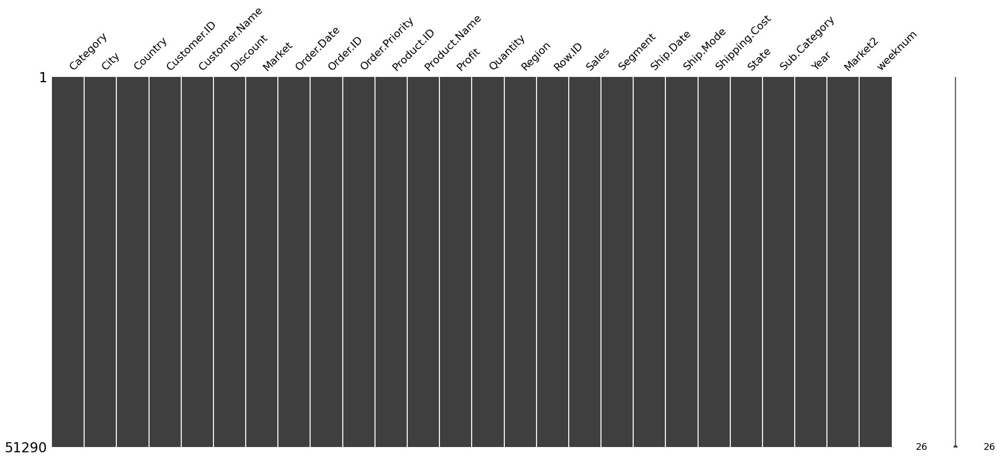

In [14]:
msno.matrix(ss)

In [13]:
# check duplicates
ss.duplicated().sum()

0

In [16]:
ss.describe()

,Discount,Order.Date,Profit,Quantity,Row.ID,Sales,Ship.Date,Shipping.Cost,Year,weeknum
count,51290.000000,51290,51290.000000,51290.000000,51290.00000,51290.000000,51290,51290.000000,51290.000000,51290.000000
mean,0.142908,2013-05-11 21:26:49.155780864,28.610982,3.476545,25645.50000,246.498440,2013-05-15 20:42:42.745174784,26.375818,2012.777208,31.287112
min,0.000000,2011-01-01 00:00:00,-6599.978000,1.000000,1.00000,0.000000,2011-01-03 00:00:00,0.002000,2011.000000,1.000000
25%,0.000000,2012-06-19 00:00:00,0.000000,2.000000,12823.25000,31.000000,2012-06-23 00:00:00,2.610000,2012.000000,20.000000
50%,0.000000,2013-07-08 00:00:00,9.240000,3.000000,25645.50000,85.000000,2013-07-12 00:00:00,7.790000,2013.000000,33.000000
75%,0.200000,2014-05-22 00:00:00,36.810000,5.000000,38467.75000,251.000000,2014-05-26 00:00:00,24.450000,2014.000000,44.000000
max,0.850000,2014-12-31 00:00:00,8399.976000,14.000000,51290.00000,22638.000000,2015-01-07 00:00:00,933.570000,2014.000000,53.000000
std,0.212280,NaN,174.340972,2.278766,14806.29199,487.567175,NaN,57.296810,1.098931,14.429795


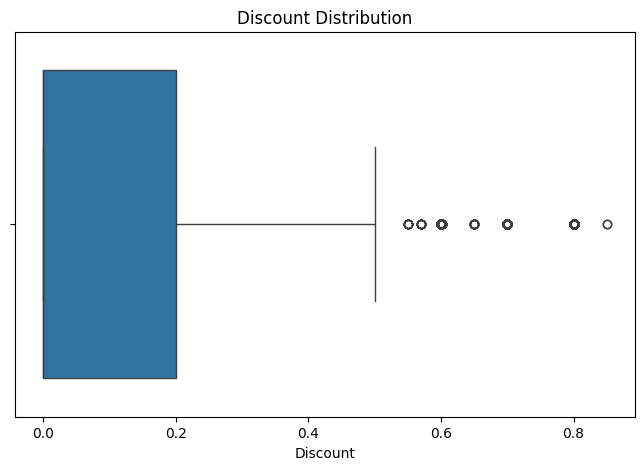

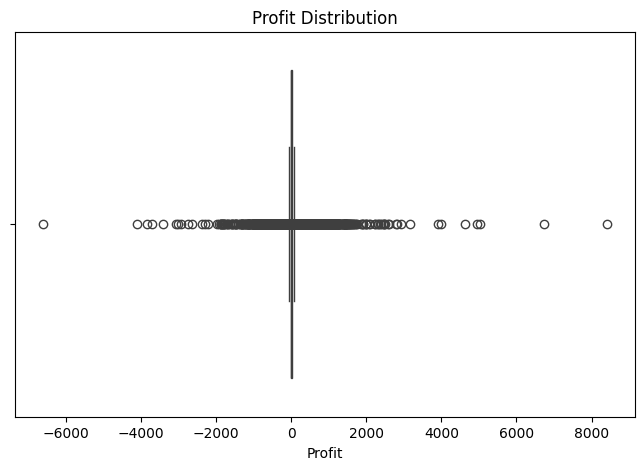

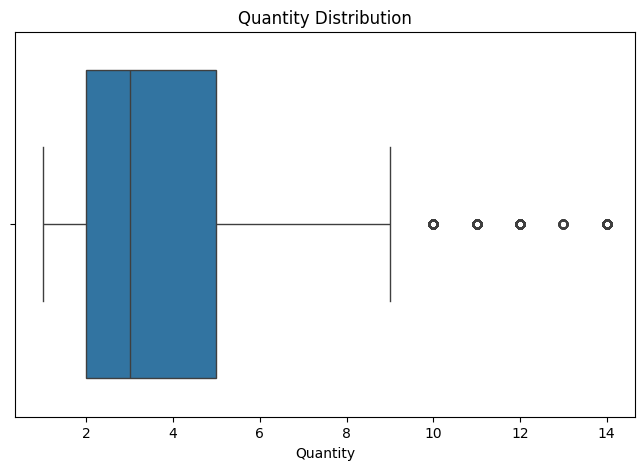

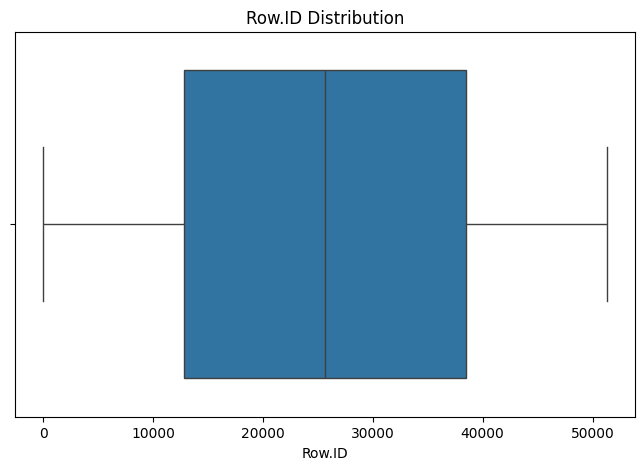

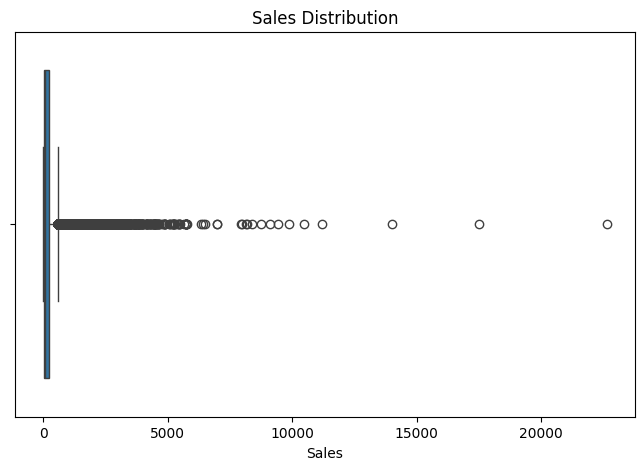

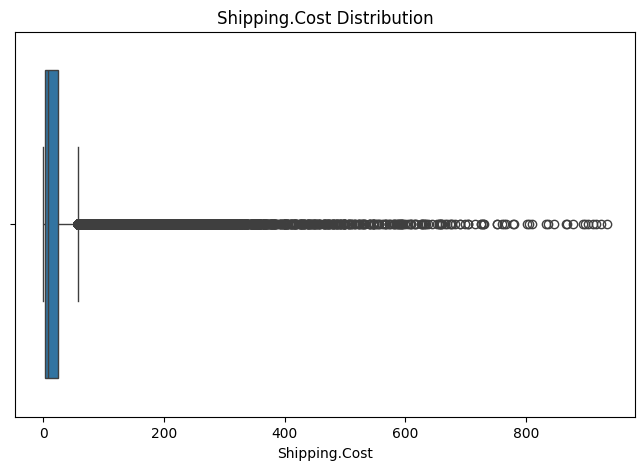

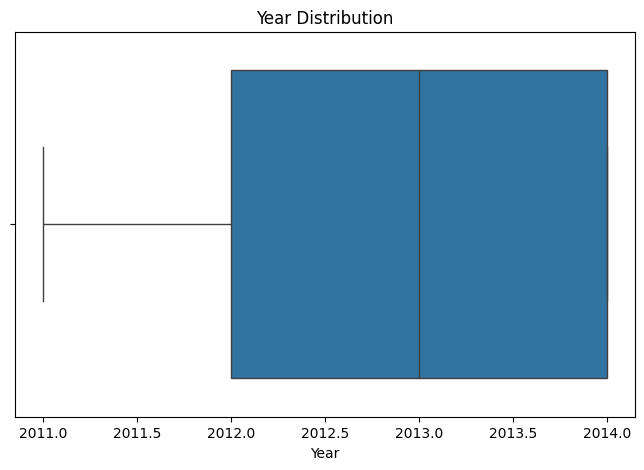

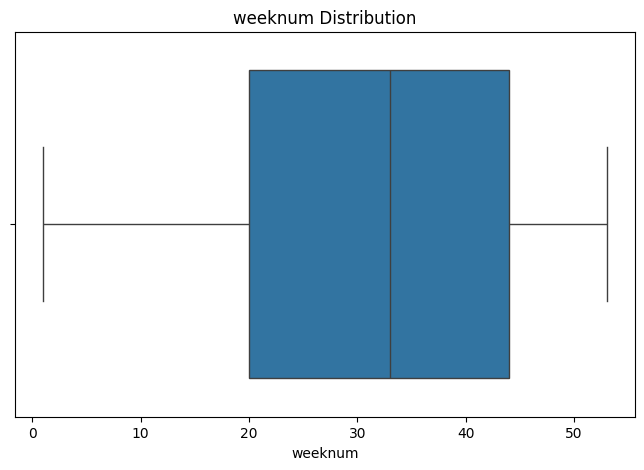

In [18]:
# check outliers
def draw_box(ss, columns):
    # Select only numeric columns
    numeric_columns = ss[columns].select_dtypes(include=['number']).columns

    if numeric_columns.empty:
        print("No numeric columns found to plot.")
        return

    for col in numeric_columns:
        plt.figure(figsize=(8, 5))
        sns.boxplot(x=ss[col]).set(title=f'{col} Distribution')
        plt.show()


draw_box(ss, ss.columns)

In [22]:
ss['Discount'].value_counts()

,count
Discount,
0.000,29009
0.200,4998
0.100,4068
0.400,3177
0.600,2006
0.700,1786
0.500,1633
0.170,735
0.470,725


In [24]:
# detect outliers
def detect_outliers_iqr_table(ss, columns=None):
    """
    Detects outliers in numerical columns using the IQR method and returns them as a DataFrame.

    Parameters:
    df (pd.DataFrame): The input dataframe.
    columns (list, optional): List of numerical columns to check. If None, all numerical columns are used.

    Returns:
    pd.DataFrame: A table showing outliers with column names and index positions.
    """
    if columns is None:
        columns = ss.select_dtypes(include=[np.number]).columns  # Select numerical columns

    outlier_rows = []

    for col in columns:
        Q1 = ss[col].quantile(0.25)
        Q3 = ss[col].quantile(0.75)
        IQR = Q3 - Q1

        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        outliers = ss[(ss[col] < lower_bound) | (ss[col] > upper_bound)][[col]].copy()
        outliers['Column'] = col
        outliers['Index'] = outliers.index

        outlier_rows.append(outliers)

    return pd.concat(outlier_rows).reset_index(drop=True) if outlier_rows else pd.DataFrame(columns=['Index', 'Column'])

outliers_table = detect_outliers_iqr_table(ss)
print(outliers_table)


       Discount         Column  Index  Profit  Quantity  Row.ID  Sales  \
0          0.60       Discount  29117     NaN       NaN     NaN    NaN   
1          0.60       Discount  29120     NaN       NaN     NaN    NaN   
2          0.60       Discount  29122     NaN       NaN     NaN    NaN   
3          0.65       Discount  29125     NaN       NaN     NaN    NaN   
4          0.65       Discount  29127     NaN       NaN     NaN    NaN   
...         ...            ...    ...     ...       ...     ...    ...   
26363       NaN  Shipping.Cost  51185     NaN       NaN     NaN    NaN   
26364       NaN  Shipping.Cost  51256     NaN       NaN     NaN    NaN   
26365       NaN  Shipping.Cost  51271     NaN       NaN     NaN    NaN   
26366       NaN  Shipping.Cost  51276     NaN       NaN     NaN    NaN   
26367       NaN  Shipping.Cost  51278     NaN       NaN     NaN    NaN   

       Shipping.Cost  Year  weeknum  
0                NaN   NaN      NaN  
1                NaN   NaN      NaN

In [26]:
# detect and replace outliers with median value

def replace_outliers_with_median_iqr(ss, columns=None):
    """
    Detects outliers in numerical columns using the IQR method and replaces them with the median.

    Parameters:
    df (pd.DataFrame): The input dataframe.
    columns (list, optional): List of numerical columns to check. If None, all numerical columns are used.

    Returns:
    pd.DataFrame: DataFrame with outliers replaced by the median.
    """
    ss_cleaned = ss.copy()  # To avoid modifying the original DataFrame

    if columns is None:
        columns = ss.select_dtypes(include=[np.number]).columns  # Select numerical columns

    for col in columns:
        Q1 = ss[col].quantile(0.25)
        Q3 = ss[col].quantile(0.75)
        IQR = Q3 - Q1

        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        median_value = ss[col].median()  # Calculate the median of the column

        # Replace outliers with median
        ss[col] = np.where((ss[col] < lower_bound) | (ss[col] > upper_bound), median_value, ss[col])

    return ss

ss_cleaned = replace_outliers_with_median_iqr(ss)
print(ss_cleaned)


              Category         City        Country Customer.ID  \
0      Office Supplies  Los Angeles  United States   LS-172304   
1      Office Supplies  Los Angeles  United States   MV-174854   
2      Office Supplies  Los Angeles  United States   CS-121304   
3      Office Supplies  Los Angeles  United States   CS-121304   
4      Office Supplies  Los Angeles  United States   AP-109154   
...                ...          ...            ...         ...   
51285  Office Supplies  Los Angeles  United States   AM-103604   
51286  Office Supplies  Los Angeles  United States   AM-103604   
51287  Office Supplies  Los Angeles  United States   HR-147704   
51288  Office Supplies  Los Angeles  United States   RM-196754   
51289  Office Supplies  Los Angeles  United States   FH-143654   

          Customer.Name  Discount Market Order.Date        Order.ID  \
0      Lycoris Saunders       0.0     US 2011-01-07  CA-2011-130813   
1         Mark Van Huff       0.0     US 2011-01-21  CA-2011-1486

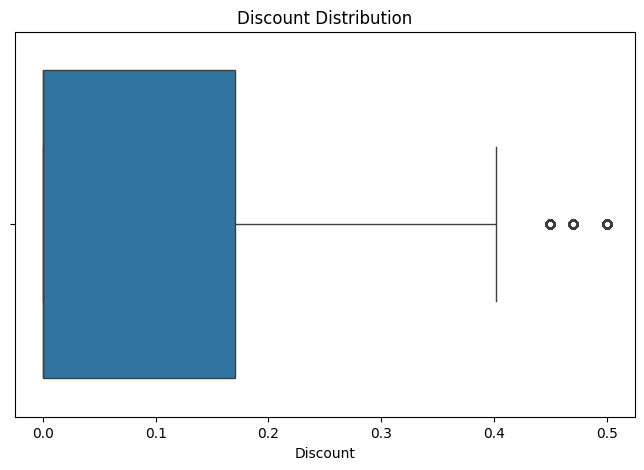

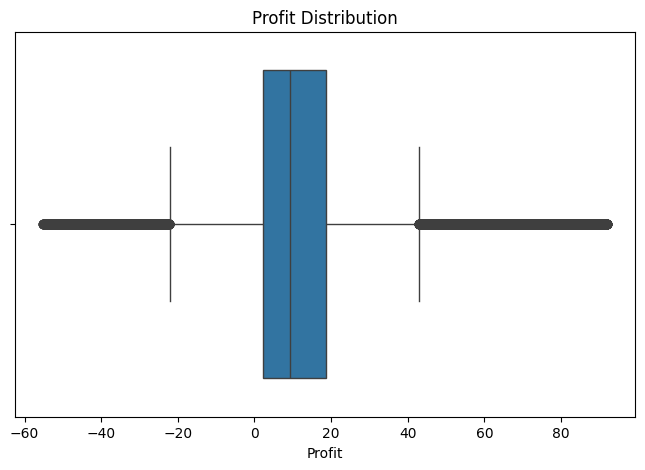

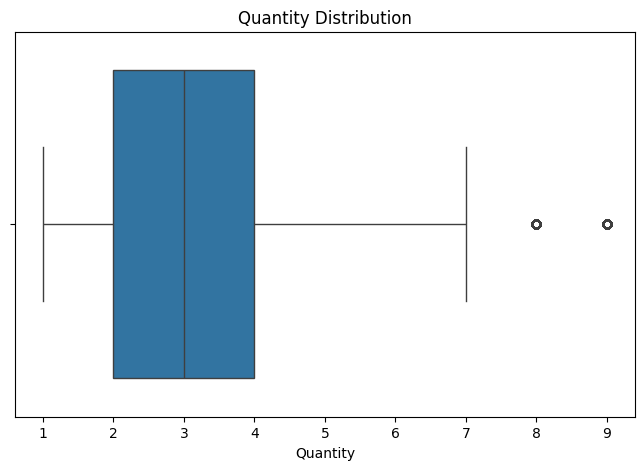

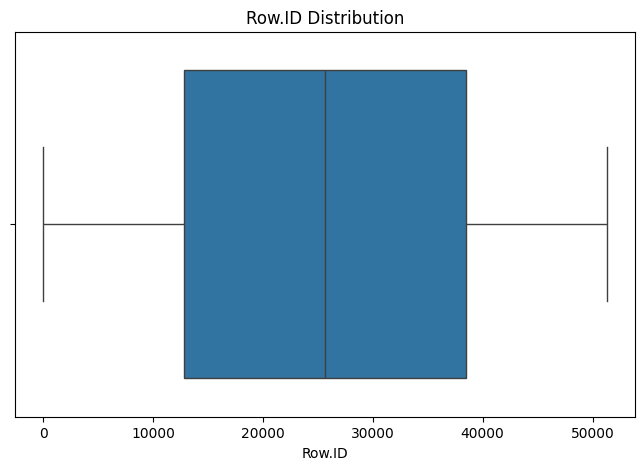

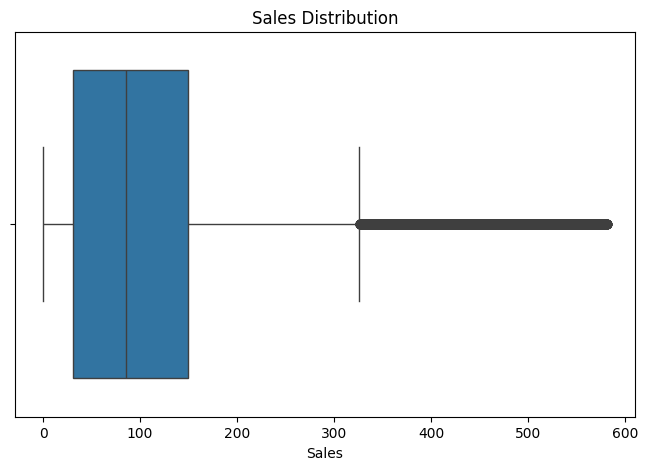

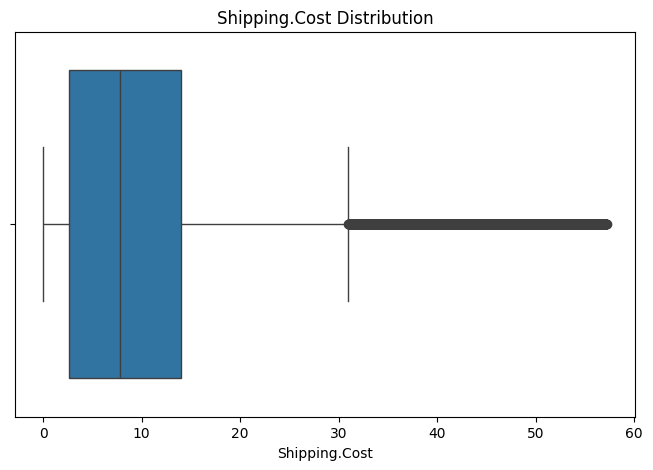

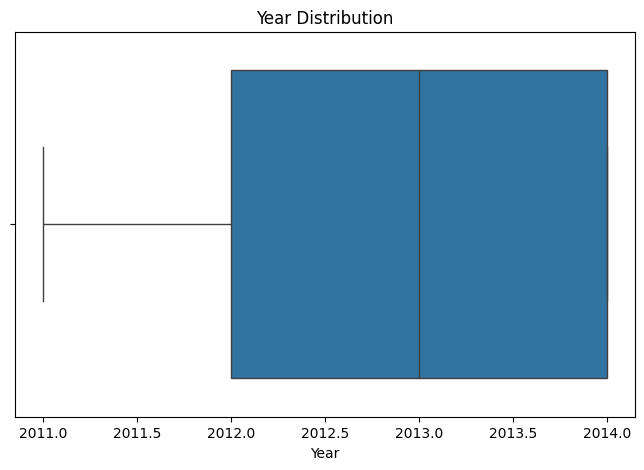

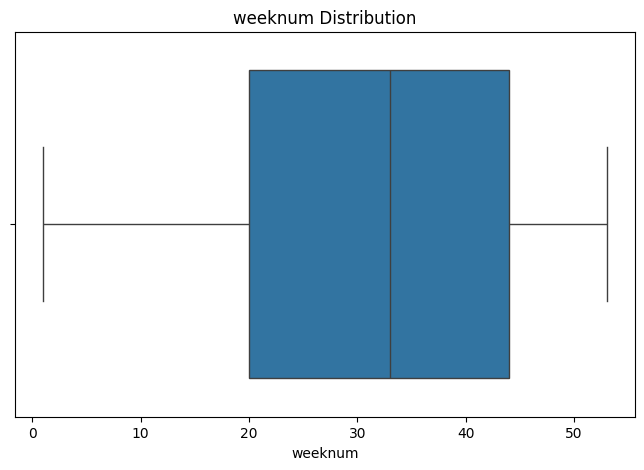

In [28]:
# check updates
draw_box(ss, ss.columns)

In [29]:
ss.describe()

,Discount,Order.Date,Profit,Quantity,Row.ID,Sales,Ship.Date,Shipping.Cost,Year,weeknum
count,51290.000000,51290,51290.000000,51290.000000,51290.00000,51290.000000,51290,51290.000000,51290.000000,51290.000000
mean,0.089378,2013-05-11 21:26:49.155780864,12.469523,3.327588,25645.50000,117.624781,2013-05-15 20:42:42.745174784,11.018195,2012.777208,31.287112
min,0.000000,2011-01-01 00:00:00,-55.125000,1.000000,1.00000,0.000000,2011-01-03 00:00:00,0.002000,2011.000000,1.000000
25%,0.000000,2012-06-19 00:00:00,2.250000,2.000000,12823.25000,31.000000,2012-06-23 00:00:00,2.610000,2012.000000,20.000000
50%,0.000000,2013-07-08 00:00:00,9.240000,3.000000,25645.50000,85.000000,2013-07-12 00:00:00,7.790000,2013.000000,33.000000
75%,0.170000,2014-05-22 00:00:00,18.540000,4.000000,38467.75000,149.000000,2014-05-26 00:00:00,13.960000,2014.000000,44.000000
max,0.500000,2014-12-31 00:00:00,91.995400,9.000000,51290.00000,581.000000,2015-01-07 00:00:00,57.200000,2014.000000,53.000000
std,0.148139,NaN,23.198068,1.993897,14806.29199,124.601227,NaN,12.161260,1.098931,14.429795


# **Questions "KPIs"**

**Total Sales??**

In [35]:
Total_Sales = ss['Sales'].sum()
Total_Sales

6032975.0

**Total Orders??**

In [39]:
ss['Order.ID'].nunique()

25035

**Total Units sold??**

In [42]:
Units_sold = ss['Quantity'].sum()
Units_sold

170672.0

**Total Proits??**

In [49]:
Total_profit = ss['Profit'].sum().round(2)
Total_profit

639561.84

**Total Customers??**




In [43]:
Total_customers = ss['Customer.ID'].nunique()
Total_customers

4873

**Best selling product??**

In [34]:
best_selling_product = ss.groupby('Product.Name')['Sales'].sum().sort_values(ascending=False).head(1)
best_selling_product

,Sales
Product.Name,
"Eldon File Cart, Single Width",22368.0


**Which city has the highest total sales??**

In [33]:
best_city_sales = ss.groupby('City')['Sales'].sum().sort_values(ascending=False).head(1)
best_city_sales

,Sales
City,
New York City,93495.0


**Best Sub-category by Sales??**

In [50]:
best_sub_category_sales = ss.groupby('Sub.Category')['Sales'].sum().sort_values(ascending=False).head(1)
best_sub_category_sales

,Sales
Sub.Category,
Storage,721184.0


**Which sub-category has the highest profit??**

In [38]:
best_sub_category_profit = ss.groupby('Sub.Category')['Profit'].sum().sort_values(ascending=False).head(1)
best_sub_category_profit

,Profit
Sub.Category,
Phones,62753.3948


**What is the most used shipping mode??**

In [44]:
most_ship_mode= ss.groupby('Ship.Mode')['Ship.Mode'].count().sort_values(ascending=False).head(1)
most_ship_mode

,Ship.Mode
Ship.Mode,
Standard Class,30775


**Best market by sales??**

In [47]:
Top_marketBy_sales = ss.groupby('Market')['Sales'].sum().sort_values(ascending=False).head(1)
Top_marketBy_sales

,Sales
Market,
APAC,1487923.0


**Oreder Priority**

In [57]:
order_pirority = ss['Order.Priority'].value_counts()
order_pirority

,count
Order.Priority,
Medium,29433
High,15501
Critical,3932
Low,2424


**Top Reigion by Sales??**

In [58]:
top_region_sales = ss.groupby('Region')['Sales'].sum().sort_values(ascending=False).head(1)
top_region_sales

,Sales
Region,
Central,1377608.0


**Top Region by profit??**

In [59]:
top_region_sales = ss.groupby('Region')['Profit'].sum().sort_values(ascending=False).head(1)
top_region_sales

,Profit
Region,
Central,143835.5087


**Top Segment by Sales??**

In [62]:
Top_segment_sales = ss.groupby('Segment')['Sales'].sum().sort_values(ascending=False).head(1)
Top_segment_sales

,Sales
Segment,
Consumer,3127277.0


**Most Ship-Mode ??**

In [67]:
Mostship_mode = ss['Ship.Mode'].value_counts().head(1)
Mostship_mode

,count
Ship.Mode,
Standard Class,30775


**Top State by Cost??**

In [69]:
Top_state_cost = ss.groupby('State')['Sales'].sum().sort_values(ascending=False).head(1)
Top_state_cost

,Sales
State,
California,213652.0


**Best country by Sales??**

In [72]:
best_country = ss.groupby('Country')['Sales'].sum().sort_values(ascending=False).head(1)
best_country

,Sales
Country,
United States,1003736.0


**Best country by proits??**

In [77]:
Best_country = ss.groupby('Country')['Profit'].sum().sort_values(ascending=False).head(1)
Best_country

,Profit
Country,
United States,127905.2709


**Best year by sales??**

In [82]:
Best_year_sales = ss.groupby(ss['Order.Date'].dt.year)['Sales'].sum().sort_values(ascending=False).head(1)
Best_year_sales

,Sales
Order.Date,
2014,2073675.0


**Best year by profits??**

In [80]:
Best_year_profits = ss.groupby(ss['Order.Date'].dt.year)['Profit'].sum().sort_values(ascending=False).head(1)
Best_year_profits

,Profit
Order.Date,
2014,216279.76588


# **Visualisations**

**Correlation**

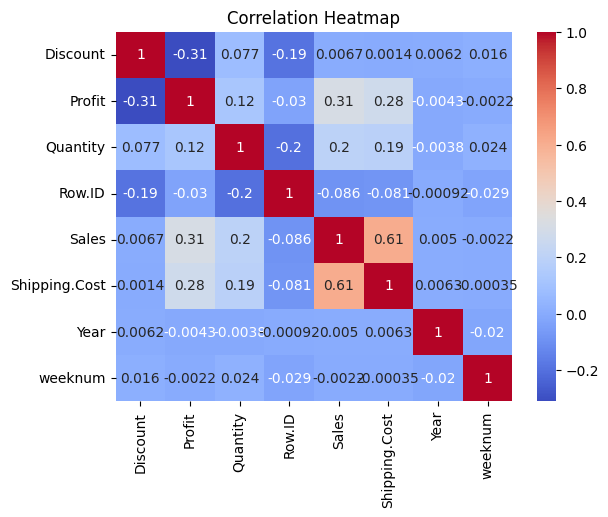

In [83]:
corr = ss.select_dtypes(include=np.number).corr() # To select only numerical columns
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

Distribution of top 3 countries

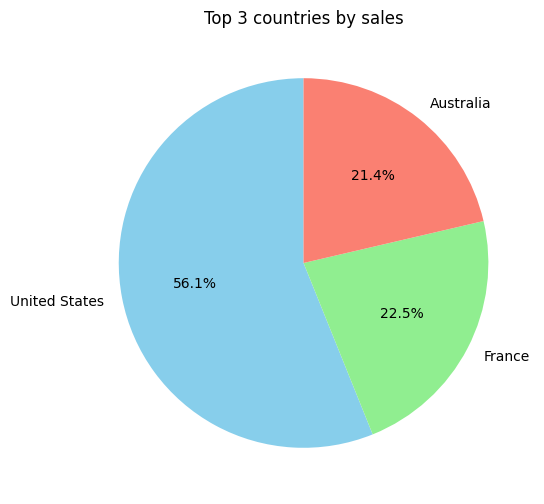

In [95]:
# count_pass = ss['Country'].value_counts().sort_values(ascending=False).head(3) # Get counts for each age category
counrty_sales = ss.groupby('Country')['Sales'].sum().sort_values(ascending=False).head(3)
# pie chart to display the percentage of each country by sales
plt.figure(figsize=(10, 6))  # Adjust the figure size
plt.pie(counrty_sales, labels=counrty_sales.index, autopct='%1.1f%%', startangle=90, colors=['skyblue', 'lightgreen', 'salmon','gold'])

plt.title('Top 3 countries by sales')
plt.show()

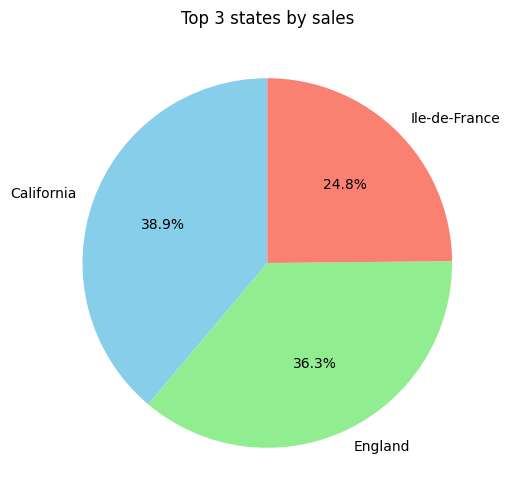

In [98]:
counrty_sales = ss.groupby('State')['Sales'].sum().sort_values(ascending=False).head(3)
# pie chart to display the percentage of each type
plt.figure(figsize=(10, 6))  # Adjust the figure size
plt.pie(counrty_sales, labels=counrty_sales.index, autopct='%1.1f%%', startangle=90, colors=['skyblue', 'lightgreen', 'salmon','gold'])

plt.title('Top 3 states by sales')
plt.show()

**Category Distribution by Sales??**

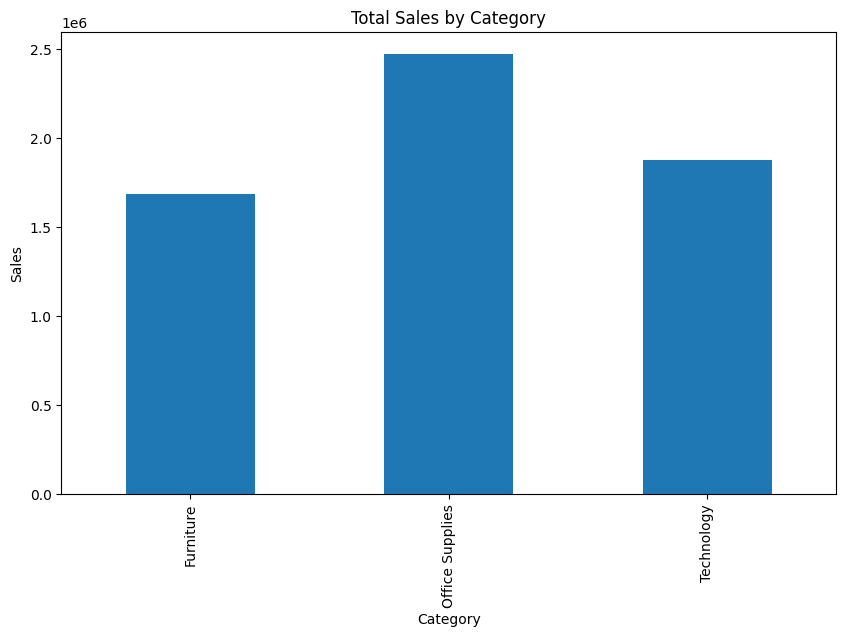

In [107]:
plt.figure(figsize=(10, 6))
ss.groupby('Category')['Sales'].sum().plot(kind='bar')
plt.title('Total Sales by Category')
plt.xlabel('Category')
plt.ylabel('Sales')
plt.show()

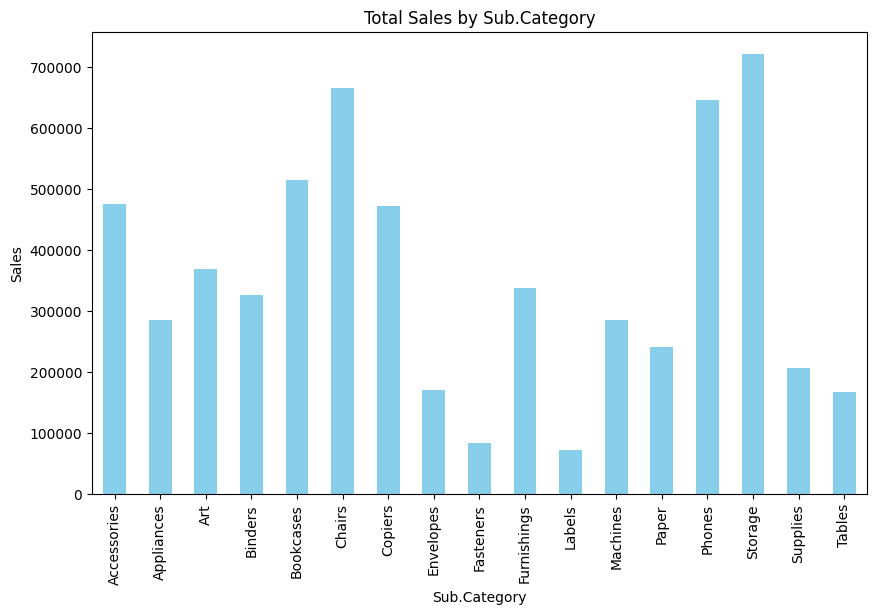

In [104]:
plt.figure(figsize=(10, 6))
ss.groupby('Sub.Category')['Sales'].sum().plot(kind='bar', color='skyblue')
plt.title('Total Sales by Sub.Category')
plt.xlabel('Sub.Category')
plt.ylabel('Sales')
plt.show()

**Market Distribution by sales**

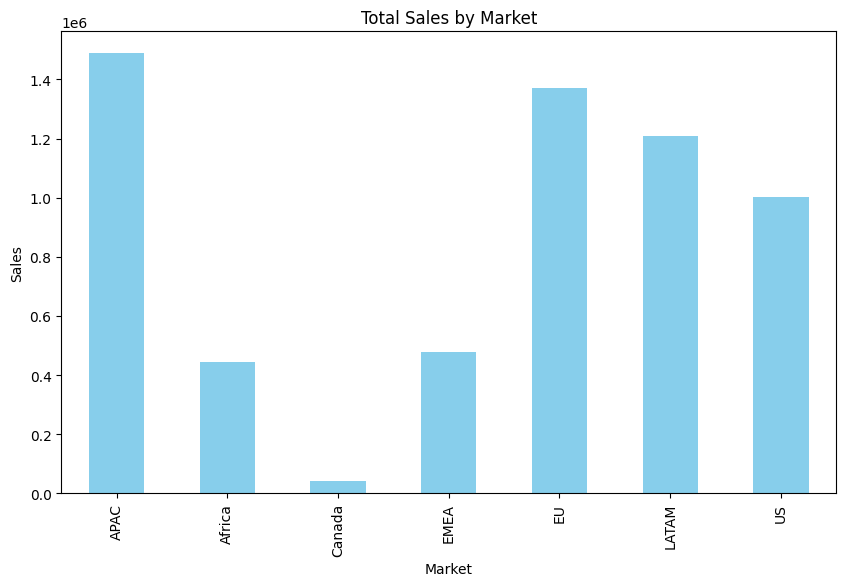

In [105]:
plt.figure(figsize=(10, 6))
ss.groupby('Market')['Sales'].sum().plot(kind='bar', color='skyblue')
plt.title('Total Sales by Market')
plt.xlabel('Market')
plt.ylabel('Sales')
plt.show()

**Top 5 Regions by Sales??**

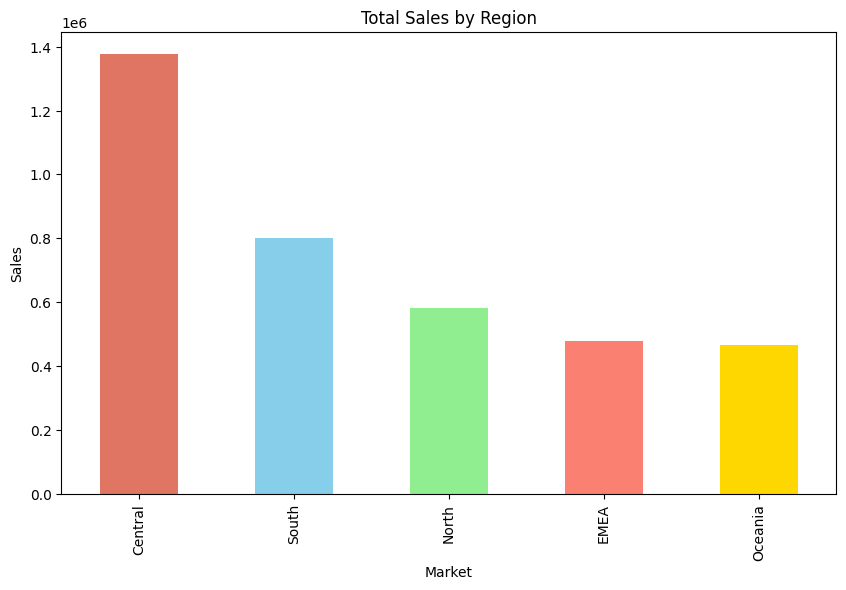

In [110]:
plt.figure(figsize=(10, 6))
ss.groupby('Region')['Sales'].sum().sort_values(ascending=False).head(5).plot(kind='bar', color=['#E17564','skyblue', 'lightgreen', 'salmon','gold'])
plt.title('Total Sales by Region')
plt.xlabel('Market')
plt.ylabel('Sales')
plt.show()

**Top 5 Regions by profit**

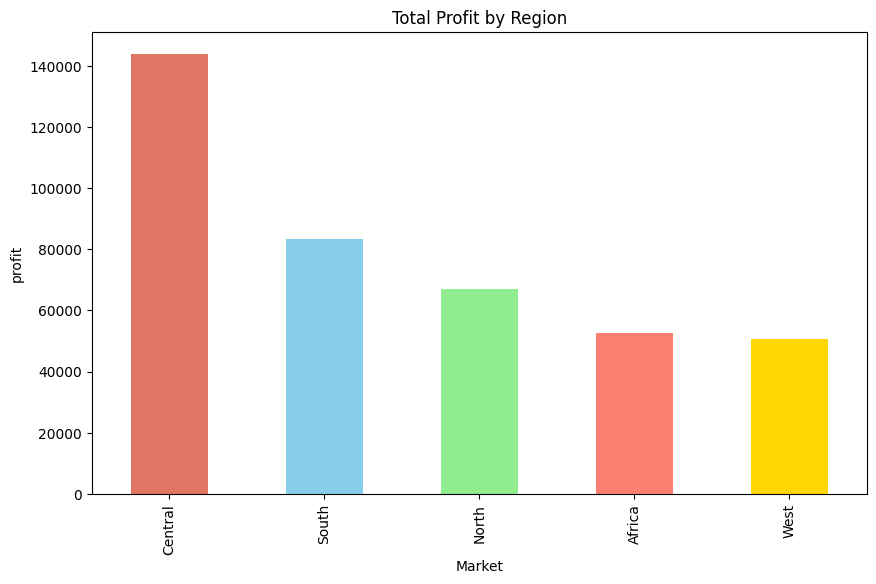

In [131]:
plt.figure(figsize=(10, 6))
ss.groupby('Region')['Profit'].sum().sort_values(ascending=False).head(5).plot(kind='bar', color=['#E17564','skyblue', 'lightgreen', 'salmon','gold'])
plt.title('Total Profit by Region')
plt.xlabel('Market')
plt.ylabel('profit')
plt.show()

**Segment distibution by sales??**

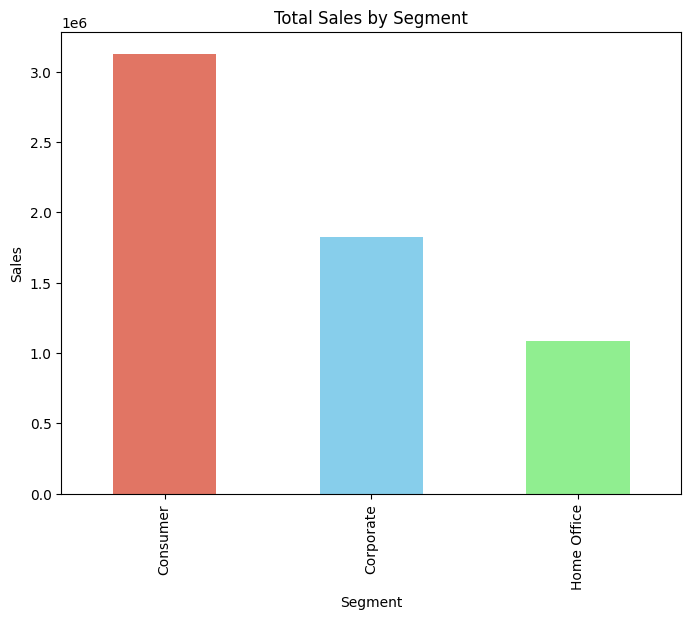

In [140]:
plt.figure(figsize=(8, 6))
ss.groupby('Segment')['Sales'].sum().sort_values(ascending=False).plot(kind='bar', color=['#E17564','skyblue', 'lightgreen', 'salmon','gold'])
plt.title('Total Sales by Segment')
plt.xlabel('Segment')
plt.ylabel('Sales')
plt.show()

**Ship Mode distribution ??**

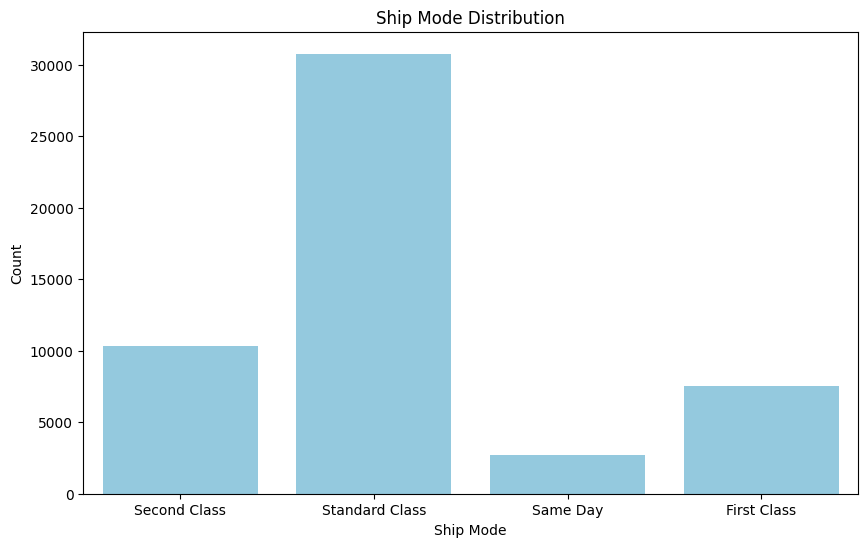

In [120]:
plt.figure(figsize=(10, 6))
sns.countplot(data=ss, x='Ship.Mode', color='skyblue')
plt.title('Ship Mode Distribution')
plt.xlabel('Ship Mode')
plt.ylabel('Count')
plt.show()

**top 5 products by quantity??**

Text(0, 0.5, 'Quantity')

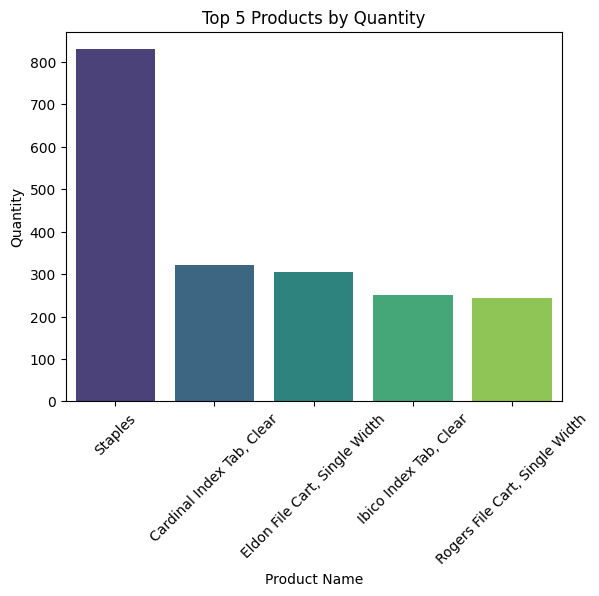

In [136]:
top_products_quantity = ss.groupby('Product.Name')['Quantity'].sum().sort_values(ascending=False).head(5)

sns.barplot(x=top_products_quantity.index, y=top_products_quantity.values, palette='viridis')
plt.title('Top 5 Products by Quantity')
plt.xlabel('Product Name')
plt.xticks(rotation=45)
plt.ylabel('Quantity')

**Top 5 products by profit??**

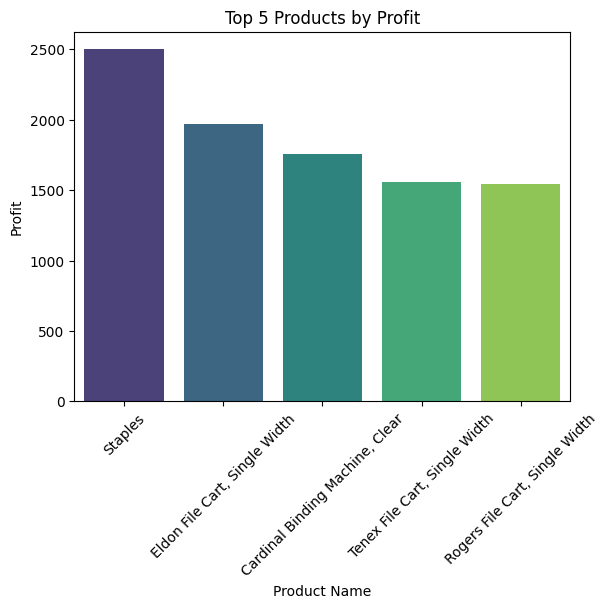

In [137]:
top_5_products_profit = ss.groupby('Product.Name')['Profit'].sum().sort_values(ascending=False).head(5)

sns.barplot(x=top_5_products_profit.index, y=top_5_products_profit.values, palette='viridis')
plt.title('Top 5 Products by Profit')
plt.xlabel('Product Name')
plt.xticks(rotation=45)
plt.ylabel('Profit')
plt.show()

**Sales Over Time?**

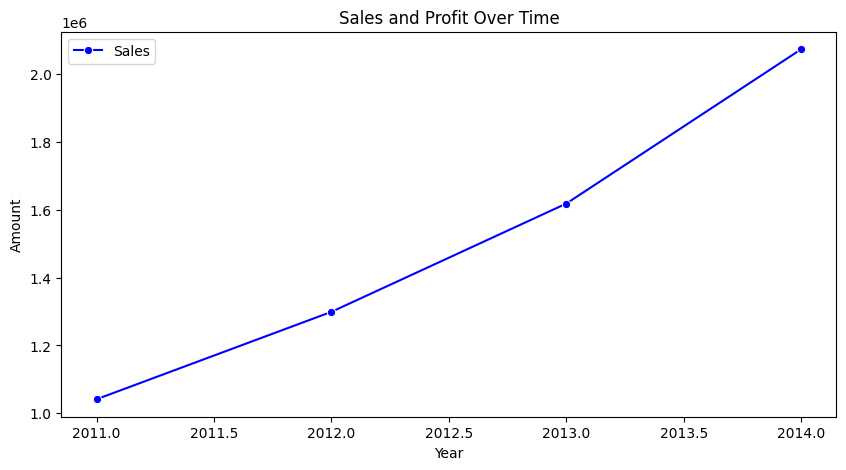

In [124]:
# Grouping Sales and Profit by Year
yearly_sales = ss.groupby('Year')['Sales'].sum()
# yearly_profit = ss.groupby('Year')['Profit'].sum()

plt.figure(figsize=(10, 5))
sns.lineplot(x=yearly_sales.index, y=yearly_sales.values, label="Sales", marker="o", color='blue')
# sns.lineplot(x=yearly_profit.index, y=yearly_profit.values, label="Profit", marker="s", color='red')

# Labels and Title
plt.xlabel("Year")
plt.ylabel("Amount")
plt.title("Sales Over Time")
plt.legend()
plt.show()

**Profit Over time??**

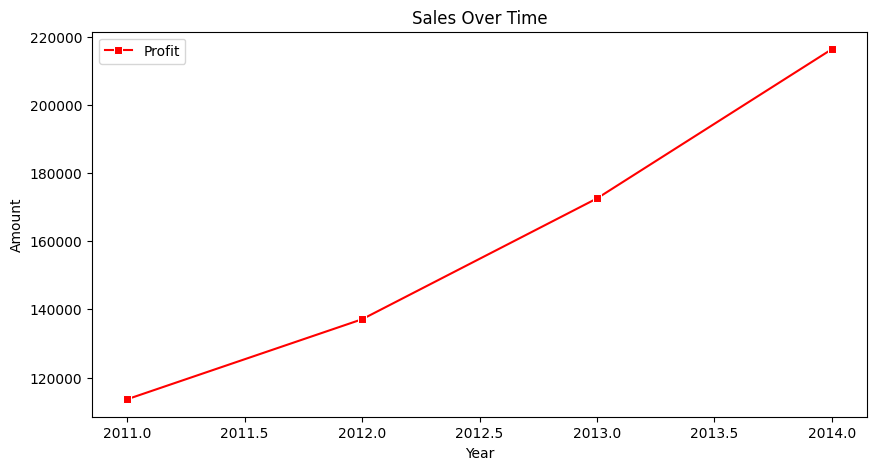

In [125]:
# Grouping Profit by Year()
yearly_profit = ss.groupby('Year')['Profit'].sum()

plt.figure(figsize=(10, 5))
sns.lineplot(x=yearly_profit.index, y=yearly_profit.values, label="Profit", marker="s", color='red')

# Labels and Title
plt.xlabel("Year")
plt.ylabel("Amount")
plt.title("Sales Over Time")
plt.legend()
plt.show()

**Sales By Month??**

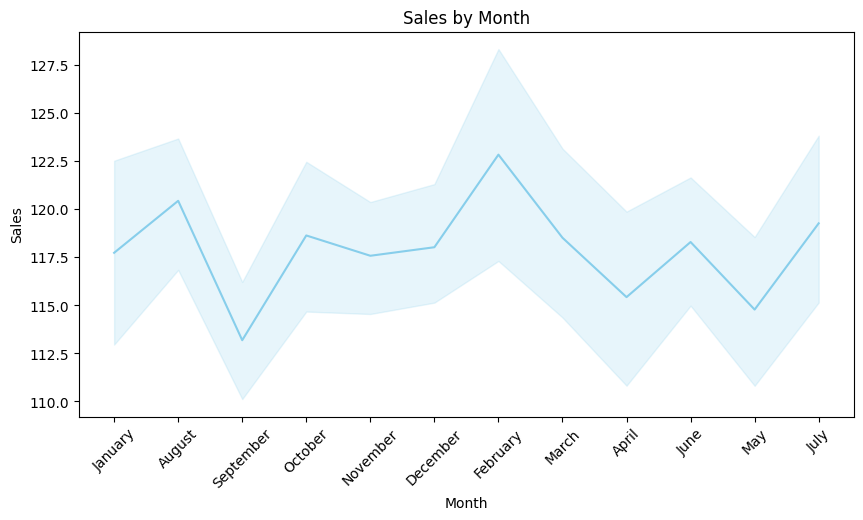

In [134]:
ss['month_name'] = ss['Order.Date'].dt.month_name()

plt.figure(figsize=(10, 5))
sns.lineplot(data=ss, x='month_name', y='Sales', color='skyblue')
plt.title('Sales by Month')
plt.xlabel('Month')
plt.ylabel('Sales')
plt.xticks(rotation=45)
plt.show()

**Profit by month??**

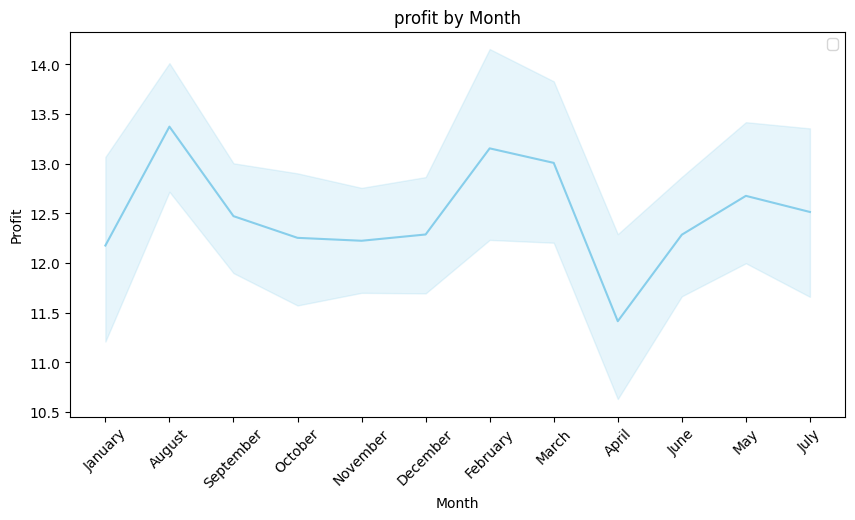

In [129]:
plt.figure(figsize=(10, 5))
sns.lineplot(data=ss, x='month_name', y='Profit', color='skyblue')
plt.title('profit by Month')
plt.xlabel('Month')
plt.ylabel('Profit')
plt.xticks(rotation=45)
plt.show()

**Sales by week??**

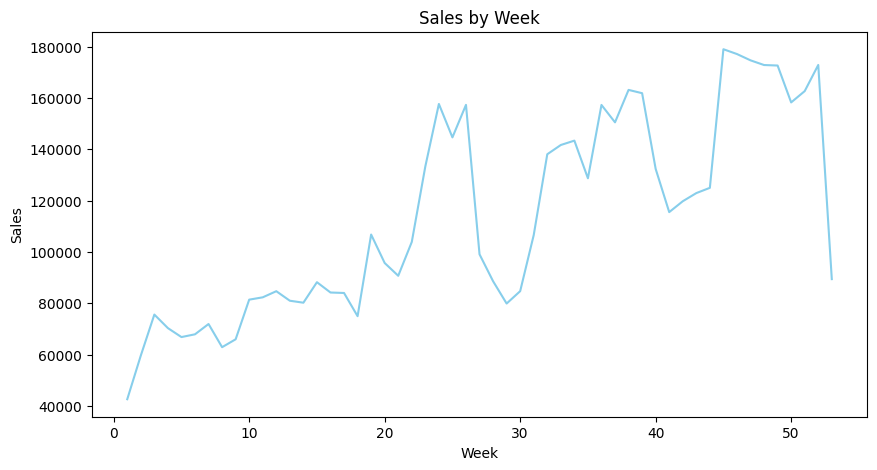

In [139]:
sales_week = ss.groupby('weeknum')['Sales'].sum()

plt.figure(figsize=(10, 5))
sns.lineplot(x=sales_week.index, y=sales_week.values, color='skyblue')
plt.xlabel('Week')
plt.ylabel('Sales')
plt.title('Sales by Week')
plt.show()